<a href="https://colab.research.google.com/github/escuccim/pytorch-face-autoencoder/blob/master/eas7_faces_6_gan_var.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Adding some longer residual connections to try to preserve some small details which seem to be getting lost; added batch norm; replaced 6x5 convolution with global average pool followed by 1x1 convolution.

Added a discriminator and training as a GAN (but still with autoencoder) to see if that improves the results. Also switched to variational autoencoder, with slight changes to architecture to keep model from getting too big. Training from scratch.

The variational model doesn't seem to be learning much, we are going to increase the size of the hidden space and try to re-train to see if the results improve.

In [0]:
import torch
import torchvision
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
%matplotlib inline
import zipfile
import os

In [0]:
from google.colab import auth
auth.authenticate_user()

In [3]:
# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'pneumonia'

!gcloud config set project {project_id}

Updated property [core/project].


In [4]:
# !gsutil cp gs://{bucket_name}/model_30_trained.pt ./gen_model_6_var.pt 
!gsutil cp gs://{bucket_name}/gen_model_6_var1.pt ./gen_model_6_var.pt 
# !gsutil cp gs://{bucket_name}/disc_model_6_var1.pt ./disc_model_6_var.pt

Copying gs://pneumonia/gen_model_6_var1.pt...
| [1 files][342.5 MiB/342.5 MiB]                                                
Operation completed over 1 objects/342.5 MiB.                                    


In [5]:
if not os.path.exists("celeba-dataset.zip"):
#   !kaggle datasets download -d jessicali9530/celeba-dataset
  !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
  zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
  zip_ref.extractall('data')
  zip_ref.close()

  zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()

Copying gs://pneumonia/celeba-dataset.zip...
| [1 files][  1.2 GiB/  1.2 GiB]   77.0 MiB/s                                   
Operation completed over 1 objects/1.2 GiB.                                      


In [6]:
if not os.path.exists("Training_Pictures.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
  zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()

--2019-06-10 05:30:07--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.156.17
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.156.17|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1073596 (1.0M) [application/zip]
Saving to: ‘Training_Pictures.zip’

Training_Pictures.z 100%[===================>]   1.02M  1.99MB/s    in 0.5s    

2019-06-10 05:30:08 (1.99 MB/s) - ‘Training_Pictures.zip’ saved [1073596/1073596]



In [8]:
# if not os.path.exists("imdb_images3.zip"):  
#   !gsutil cp gs://{bucket_name}/imdb_images3.zip ./imdb_images3.zip
#   zip_ref = zipfile.ZipFile('imdb_images3.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()

if not os.path.exists("crop_part1.tar.gz"):
  !gsutil cp gs://{bucket_name}/crop_part1.tar.gz ./crop_part1.tar.gz
  !tar -xf crop_part1.tar.gz -C data/images

Copying gs://pneumonia/crop_part1.tar.gz...
\ [1 files][ 43.3 MiB/ 43.3 MiB]                                                
Operation completed over 1 objects/43.3 MiB.                                     


In [9]:
# get test data
# if not os.path.exists("faces94.zip"):
#   !wget https://cswww.essex.ac.uk/mv/allfaces/faces94.zip
#   zip_ref = zipfile.ZipFile('faces94.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()
  
# if not os.path.exists("faces96.zip"):
#   !wget https://cswww.essex.ac.uk/mv/allfaces/faces96.zip  
#   zip_ref = zipfile.ZipFile('faces96.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()

if not os.path.exists("wiki_images2.zip"):
  !gsutil cp gs://{bucket_name}/wiki_images2.zip ./wiki_images.zip
  zip_ref = zipfile.ZipFile('wiki_images.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()

if not os.path.exists("faces95.zip"):
  !wget https://cswww.essex.ac.uk/mv/allfaces/faces95.zip  
  zip_ref = zipfile.ZipFile('faces95.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()
  
if not os.path.exists("GWB_200x200_JPEG.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
  zip_ref = zipfile.ZipFile('GWB_200x200_JPEG.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()    

Copying gs://pneumonia/wiki_images2.zip...
/ [1 files][160.5 MiB/160.5 MiB]                                                
Operation completed over 1 objects/160.5 MiB.                                    
--2019-06-10 05:30:33--  https://cswww.essex.ac.uk/mv/allfaces/faces95.zip
Resolving cswww.essex.ac.uk (cswww.essex.ac.uk)... 155.245.92.179
Connecting to cswww.essex.ac.uk (cswww.essex.ac.uk)|155.245.92.179|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6425534 (6.1M) [application/zip]
Saving to: ‘faces95.zip’

faces95.zip         100%[===================>]   6.13M  6.79MB/s    in 0.9s    

2019-06-10 05:30:34 (6.79 MB/s) - ‘faces95.zip’ saved [6425534/6425534]

--2019-06-10 05:30:35--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.155.53
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.155.53|:443... connected.
HTTP request sent, aw

In [0]:
BATCH_SIZE = 24
data_path = "data/images"

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
      torchvision.transforms.RandomApply([
        torchvision.transforms.RandomAffine(degrees=7, translate=(0.05,0.05), scale=(0.9,1.1), shear=3, resample=False, fillcolor=0),        
      ], 0.6),
      torchvision.transforms.RandomResizedCrop((192,160), scale=(0.8, 1.20)),
      torchvision.transforms.ToTensor(),
    ])

transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.RandomResizedCrop((192,160), scale=(0.95, 1.05)),
      torchvision.transforms.ToTensor(),
    ])

train_dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transform
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=2,
    shuffle=True
)

test_dataset = torchvision.datasets.ImageFolder(
        root="data/test_images",
        transform=transform2
    )

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=32,
    num_workers=1,
    shuffle=True
)

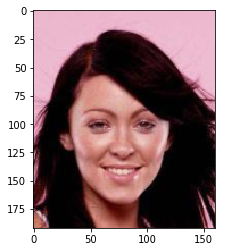

In [11]:
for (images, _) in train_loader:
  plt.imshow(images[0].permute(1,2,0))
  plt.show()
  break

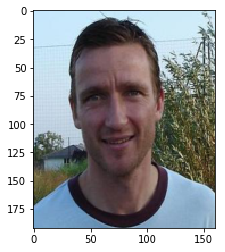

In [12]:
for (images, _) in test_loader:
  plt.imshow(images[0].permute(1,2,0))
  plt.show()
  break

In [13]:
train_dataset

Dataset ImageFolder
    Number of datapoints: 212421
    Root location: data/images

In [14]:
test_dataset

Dataset ImageFolder
    Number of datapoints: 17629
    Root location: data/test_images

In [0]:
def output_size(i, k=3, p=2, s=1, d=1):
    o = (i + 2*p - k - (k-1)*(d-1))/s + 1
    return o
  
output_size(i=64, k=3, p=1)

### Bigger Model

In [0]:
epoch_list = [0]

In [0]:
def vae_loss(x, x_hat, mu=None, logvar=None, d_faked=None):
    beta_mse = 15.0
    beta_kld = 0.01
    # MSE for reconstructions
    MSE = nn.functional.mse_loss(x, x_hat) * beta_mse
    
    # variational loss IF we are doing variational
    if mu is not None and logvar is not None:
        KLD = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp()) 
        MSE = MSE + KLD
    
    # weight the MSE loss higher so the discriminator loss doesn't overwhelm it
    if d_faked is not None:
        ones = torch.ones(x.shape[0]).cuda()
        g_loss =  nn.functional.binary_cross_entropy_with_logits(d_faked, ones, reduction="mean") * beta_kld
        MSE += g_loss
        
    return MSE
  
def disc_loss(d_true, d_faked):
    ones = torch.ones(d_true.shape[0]).cuda()
    zeros = torch.zeros(d_true.shape[0]).cuda()
    d_loss_real = nn.functional.binary_cross_entropy_with_logits(d_true, ones, reduction="mean")
    d_loss_fake = nn.functional.binary_cross_entropy_with_logits(d_faked, zeros, reduction="mean")
    d_loss = d_loss_real + d_loss_fake


    return d_loss

def disc_loss2(labels, logits):
    d_loss = nn.functional.binary_cross_entropy_with_logits(logits, labels, reduction="mean")
    
    return d_loss    
  
def train_discriminator(discriminator, generator, train_loader, d_optimizer, g_optimizer, train_gen=True, train_disc=True, test_loader=None, print_metrics=1000, extra_gen_train=2, plot_images=4000, num_epochs=10, display_images=5, g_scheduler=None, d_scheduler=None, d_save_path="disc_model_7.pt", g_save_path="gen_model_7g.pt"):
    
    # if we aren't training the generator we don't need to train the discriminator less than every epoch
    if train_gen is False:
      extra_gen_train = 1
      
    try:
      for epoch in range(num_epochs):
          discriminator.train()
          generator.train()
          d_upload_path = d_save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          g_upload_path = g_save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          
          d_tr_loss = 0.0
          g_tr_loss = 0.0
          d_test_loss = 0.0
          g_test_loss = 0.0
          test_loss = 0.0
          test_d_loss = 0
          
          test_d_acc = []
          batch_losses = []
          batch_accuracies = []
          
          for i, (inputs, _) in enumerate(train_loader):
              if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()

              d_optimizer.zero_grad()
              g_optimizer.zero_grad()
              
              # generate our fake images
              if train_gen:
                  recon, code, logvar = generator(inputs)
              else:
                with torch.no_grad():
                    recon, code, logvar = generator(inputs)
              
              # concat the real images and the recons
              disc_batch = torch.cat((inputs, recon), 0)
              
              # feed the batch to the discriminator
              d_logits = discriminator(disc_batch)
              
              batch_size = d_logits.shape[0] // 2
              if use_cuda:
                  ones = torch.ones(batch_size).cuda()
                  zeros = torch.zeros(batch_size).cuda()
              else:
                  ones = torch.ones(batch_size)
                  zeros = torch.zeros(batch_size)

              labels = torch.cat((ones, zeros))
              
              # separate the logits back
              d_loss = disc_loss2(labels, d_logits)
              
              # update the discriminator every other step to give the generator time to catch up
              if train_disc and i % extra_gen_train == 0:
                d_loss.backward(retain_graph=True)
                d_optimizer.step()

              # calculate the accuracy of our discriminator
              d_preds = torch.sigmoid(d_logits).round()
              
              d_accuracy = torch.mean((d_preds == labels).double())
              batch_accuracies.append(d_accuracy.item())
              
              # update the generator, use no grad if we aren't training the generator to speed things up and save RAM
              if train_gen:
                # separate the fake logits back out so we can feed them to the gen loss function
                faked_logits = d_logits[batch_size:]
                g_loss = vae_loss(inputs, recon, code, logvar=logvar, d_faked=faked_logits)
                g_loss.backward()
                g_optimizer.step()
              else:
                with torch.no_grad():
                  g_loss = vae_loss(inputs, recon, code, logvar=logvar, d_faked=faked_logits)
              
              g_tr_loss += g_loss.item()
                  
              d_tr_loss += d_loss.item()
              batch_losses.append(g_loss.item())
            
              if i > 0 and print_metrics != 0 and i % print_metrics == 0:
                print("\tEpoch", len(epoch_list), "batch", i, "gen loss:", g_loss.item(), "disc loss:", d_loss.item(), "disc acc:", np.mean(batch_accuracies))

              if i % plot_images == 0 and i > 0:
                fig, ax = plt.subplots(1, 2, figsize=(6,6))
                ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                plt.show()
          
          if epoch % display_images == 0:
              # plot a few random images
              try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Training Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
              except Exception as e:
                  print(e)

              torch.save(discriminator.state_dict(), d_save_path)
              torch.save(generator.state_dict(), g_save_path)
          
          if test_loader is not None:
            generator.eval()
            discriminator.eval()
            with torch.no_grad():
              for i, (inputs, _) in enumerate(test_loader):
                if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()
                
                # autoencode the input images
                recon, code, logvar = generator(inputs)

                loss = vae_loss(inputs, recon, code, logvar=logvar)
                test_loss += loss.item()
                
                # combine the real and recon images into a single batch for the discriminator
                disc_batch = torch.cat((inputs, recon), 0)

                # feed the batch to the discriminator
                d_logits = discriminator(disc_batch)
                
                # create labels for the disc loss function
                batch_size = d_logits.shape[0] // 2
                if use_cuda:
                    ones = torch.ones(batch_size).cuda()
                    zeros = torch.zeros(batch_size).cuda()
                else:
                    ones = torch.ones(batch_size)
                    zeros = torch.zeros(batch_size)

                labels = torch.cat((ones, zeros))
                
                # run the discriminator loss function
                d_loss = disc_loss2(labels, d_logits)
                test_d_loss += d_loss.item()
                
                # calculate the accuracy of our discriminator
                d_preds = torch.sigmoid(d_logits).round()
                d_accuracy = torch.mean((d_preds == labels).double())
                test_d_acc.append(d_accuracy.item())
                
            try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Test Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
            except Exception as e:
                print(e)
                  
          print("Epoch:", len(epoch_list), "Gen Train Loss:", g_tr_loss, "Disc Train Loss:", d_tr_loss, "Test Loss:", test_loss, "Avg Tr Disc Acc:", np.mean(batch_accuracies), "Avg Te Disc Acc:", np.mean(test_d_acc))
          
          epoch_list.append(epoch)
          
          if g_scheduler is not None and epoch % 5 == 0 and epoch > 1:
              g_scheduler.step()
              
          if d_scheduler is not None and epoch % 5 == 0 and epoch > 1:
              d_scheduler.step()
 
    except KeyboardInterrupt:
      print("Interrupting... Saving model...")
      torch.save(generator.state_dict(), g_save_path)
      torch.save(discriminator.state_dict(), d_save_path)
      !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
      !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
      return 
    
    !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
    !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
      
def train(model, train_loader, optimizer, test_loader=None, print_metrics=1000, plot_images=4000, num_epochs=10, display_images=5, scheduler=None, save_path="model_6.pt"):
    try:
      for epoch in range(num_epochs):
          model.train()
          upload_path = save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          
          tr_loss = 0.0
          test_loss = 0
          batch_losses = []
          for i, (inputs, _) in enumerate(train_loader):
              if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()

              optimizer.zero_grad()

              recon, code, logvar = model(inputs)
              if model.variational:
                  loss = vae_loss(inputs, recon, code, logvar=logvar)
              else:  
                  loss = vae_loss(inputs, recon, code, logvar=None)

              loss.backward()
              optimizer.step()

              tr_loss += loss.item()
              batch_losses.append(loss.item())
            
              if i > 0 and print_metrics != 0 and i % print_metrics == 0:
                print("\tEpoch", len(epoch_list), "batch", i, "loss:", loss.item())

              if i % plot_images == 0 and i > 0:
                fig, ax = plt.subplots(1, 2, figsize=(6,6))
                ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                plt.show()
          
          if epoch % display_images == 0:
              # plot a few random images
              try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Training Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
              except Exception as e:
                  print(e)

              torch.save(model.state_dict(), save_path)
#               !gsutil cp ./model.pt gs://{bucket_name}/
          
          if test_loader is not None:
            model.eval()
            with torch.no_grad():
              for i, (inputs, _) in enumerate(test_loader):
                if use_cuda and torch.cuda.is_available():
                    inputs = inputs.cuda()

                recon, code, logvar = model(inputs)

                if model.variational:
                    loss = vae_loss(inputs, recon, code, logvar=logvar)
                else:  
                    loss = vae_loss(inputs, recon, code, logvar=None)

                test_loss += loss.item()

            try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Test Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
            except Exception as e:
                print(e)
                  
          print("Epoch:", len(epoch_list), "Train Loss:", tr_loss, "Test Loss:", test_loss)
          
          epoch_list.append(epoch)
          
          if scheduler is not None and epoch % 5 == 0 and epoch > 1:
              scheduler.step()

                
    except KeyboardInterrupt:
      print("Interrupting... Saving model...")
      torch.save(model.state_dict(), save_path)
      !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
      return 
    
    !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
      
def count_params(model):
  model_parameters = filter(lambda p: p.requires_grad, model.parameters())
  params = sum([np.prod(p.size()) for p in model_parameters])
  return params               

In [0]:
from torch import nn
class Encoder(nn.Module):
    def __init__(self, latent_dim, variational=False):
        super(Encoder, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)        
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 32, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(32)
        self.downsize1 = nn.Conv2d(96, 32, 1)
        self.bn_ds1 = nn.BatchNorm2d(32)
        
        # block 2
        self.conv4 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(64)
        self.conv5 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(64)
        self.conv6 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(64)
        self.downsize2 = nn.Conv2d(192, 64, 1)
        self.bn_ds2 = nn.BatchNorm2d(64)
        
        # block 3
        self.conv7 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(128)
        self.conv8 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(128)
        self.conv9 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn9 = nn.BatchNorm2d(128)
        self.downsize3 = nn.Conv2d(384, 128, 1)
        self.bn_ds3 = nn.BatchNorm2d(128)
        
        # block 4
        self.conv10 = nn.Conv2d(128, 256, 3, padding=1)
        self.bn10 = nn.BatchNorm2d(256)
        self.conv11 = nn.Conv2d(256, 256, 3, padding=1)
        self.bn11 = nn.BatchNorm2d(256)
        self.downsize4 = nn.Conv2d(512, 256, 1)
        self.bn_ds4 = nn.BatchNorm2d(256)
        
        # block 5
        self.conv12 = nn.Conv2d(256, 384, 3, padding=1)
        self.bn12 = nn.BatchNorm2d(384)
        self.conv13 = nn.Conv2d(384, 384, 3, padding=1)
        self.bn13 = nn.BatchNorm2d(384)
        self.downsize5 = nn.Conv2d(768, 512, 1)
        self.bn_ds5 = nn.BatchNorm2d(512)
        
        self.fc1 = nn.Conv2d(512, 2048, 2) 
        self.bn16 = nn.BatchNorm2d(2048)
        self.fc2 = nn.Conv2d(2048, latent_dim, 1) # code layer
        
        self.variational = variational
        if variational:
            self.fc3 = nn.Conv2d(2048, latent_dim, 1) # variance layer
        
        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.gap = nn.AdaptiveMaxPool2d(2)
        
        
    def encode(self, x):
        # input 192x160x3 - output 96x80x32
        h1 = self.relu(self.bn1(self.conv1(x)))
        h2 = self.relu(self.bn2(self.conv2(h1)))
        h3 = self.relu(self.bn3(self.conv3(h2)))
        ds1 = self.relu(self.bn_ds1(self.downsize1(torch.cat((h1,h2,h3), 1))))
        mp1 = self.max_pool(ds1)
        
        # input 89x89x32 - output 64x48x40
        h4 = self.relu(self.bn4(self.conv4(mp1)))
        h5 = self.relu(self.bn5(self.conv5(h4)))
        h6 = self.relu(self.bn6(self.conv6(h5)))
        ds2 = self.relu(self.bn_ds2(self.downsize2(torch.cat((h4,h5,h6), 1))))
        mp2 = self.max_pool(ds2)
        
        # input 54x44x64 - output 128x24x20
        h7 = self.relu(self.bn7(self.conv7(mp2)))
        h8 = self.relu(self.bn8(self.conv8(h7)))
        h9 = self.relu(self.bn9(self.conv9(h8)))
        ds3 = self.relu(self.bn_ds3(self.downsize3(torch.cat((h7,h8,h9), 1))))
        mp3 = self.max_pool(ds3)
        
        # input 128x22x22 - output 256x12x10
        h10 = self.relu(self.bn10(self.conv10(mp3)))
        h11 = self.relu(self.bn11(self.conv11(h10)))
        ds4 = self.relu(self.bn_ds4(self.downsize4(torch.cat((h10,h11), 1))))
        mp4 = self.max_pool(ds4)
        
        # input 256x11x11 - output 384x6x5
        h12 = self.relu(self.bn12(self.conv12(mp4)))
        h13 = self.relu(self.bn13(self.conv13(h12)))
        ds5 = self.relu(self.bn_ds5(self.downsize5(torch.cat((h12,h13), 1))))
        mp5 = self.gap(ds5)
        
        # input 4x4x64 - output latent_dimx1
        fc1 = self.relu(self.bn16(self.fc1(mp5)))
        code = self.fc2(fc1)
        
        if self.variational:
            logvar = self.fc3(fc1)
        else:
            logvar = None
  
        return code, logvar
  
    def forward(self, x):
        code, logvar = self.encode(x)
        return code, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim):
        super(Decoder, self).__init__()
        self.fc1 = nn.ConvTranspose2d(latent_dim, 512, (6,5), stride=1)
        self.bn0 = nn.BatchNorm2d(512)
        self.deconv1 = nn.ConvTranspose2d(512, 384, 2, stride=2, output_padding=0)
        self.bn1 = nn.BatchNorm2d(384)
        self.deconv3 = nn.ConvTranspose2d(384, 256, 2, stride=2, output_padding=0)
        self.bn3 = nn.BatchNorm2d(256)
        self.deconv4 = nn.ConvTranspose2d(256, 224, 2, stride=2, output_padding=0)
        self.bn4 = nn.BatchNorm2d(224)
        self.deconv5 = nn.ConvTranspose2d(224, 192, 2, stride=2, output_padding=0)
        self.bn5 = nn.BatchNorm2d(192)
        self.deconv6 = nn.ConvTranspose2d(192, 128, 2, stride=2, output_padding=0)
        self.bn6 = nn.BatchNorm2d(128)
        self.deconv8 = nn.Conv2d(128, 3, 1, stride=1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
  
    def decode(self, x):
        # input latent_dimx1 - output 2048x1
        h0 = self.relu(self.bn0(self.fc1(x)))
        
        # in 5x5 - out 10x10
        h1 = self.relu(self.bn1(self.deconv1(h0)))
        
        # in 10x10 - out 20x20
        h3 = self.relu(self.bn3(self.deconv3(h1)))
        h4 = self.relu(self.bn4(self.deconv4(h3)))
        h5 = self.relu(self.bn5(self.deconv5(h4)))
        h6 = self.relu(self.bn6(self.deconv6(h5)))
        h8 = self.deconv8(h6)
      
        return self.sigmoid(h8)
    
    def forward(self, x):
        return self.decode(x)
    
# a model that uses the Encoder and Decoder
class SingleModel(nn.Module):
    def __init__(self, encoder, decoder, variational=False):
        super(SingleModel, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.variational = encoder.variational

    def sample(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.autograd.Variable(std.data.new(std.size()).normal_())
        return eps.mul(std).add_(mu)

    def forward(self, X):
        mu, logvar = encoder(X)

        if self.training and logvar is not None:
            z = self.sample(mu, logvar)
        else:
            z = mu
            
        recon = self.decoder(z)
        
        return recon, mu, logvar

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 48, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(48)
        self.conv2 = nn.Conv2d(48, 48, 3, padding=1)        
        self.bn2 = nn.BatchNorm2d(48)
        self.conv3 = nn.Conv2d(48, 48, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(48)
        
        # block 2
        self.conv4 = nn.Conv2d(48, 96, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(96)
        self.conv5 = nn.Conv2d(96, 96, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(96)
        self.conv6 = nn.Conv2d(96, 96, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(96)
        
        # block 3
        self.conv7 = nn.Conv2d(96, 192, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(192)
        self.conv8 = nn.Conv2d(192, 192, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(192)
        self.conv9 = nn.Conv2d(192, 192, 3, padding=1)
        self.bn9 = nn.BatchNorm2d(192)
        
        # block 4
        self.conv10 = nn.Conv2d(192, 384, 3, padding=1)
        self.bn10 = nn.BatchNorm2d(384)
        self.conv11 = nn.Conv2d(384, 384, 3, padding=1)
        self.bn11 = nn.BatchNorm2d(384)
        
        # block 5
        self.conv12 = nn.Conv2d(384, 512, 3, padding=1)
        self.bn12 = nn.BatchNorm2d(512)
        self.conv13 = nn.Conv2d(512, 1024, 3, padding=1)
        self.bn13 = nn.BatchNorm2d(1024)
        
        self.fc1 = nn.Conv2d(1024, 2048, 1) # code layer
        self.bn14 = nn.BatchNorm2d(2048)
        self.fc2 = nn.Conv2d(2048, 1, 1)
        
        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.gap = nn.AdaptiveMaxPool2d(1)
        
        self.dropout1 = nn.Dropout2d(0.25)
        self.dropout2 = nn.Dropout2d(0.50)
        
    def discriminate(self, x):
        # input 192x160x3 - output 96x80x32
        h1 = self.relu(self.bn1(self.conv1(x)))
        h2 = self.relu(self.bn2(self.conv2(h1)))
        h3 = self.relu(self.bn3(self.conv3(h2)))
        mp1 = self.max_pool(h3)
        
        # input 89x89x32 - output 64x48x40
        h4 = self.relu(self.bn4(self.conv4(mp1)))
        h5 = self.relu(self.bn5(self.conv5(h4)))
        h6 = self.relu(self.bn6(self.conv6(h5)))
        mp2 = self.max_pool(h6)
        
        # input 54x44x64 - output 128x24x20
        h7 = self.relu(self.bn7(self.conv7(mp2)))
        h8 = self.relu(self.bn8(self.conv8(h7)))
        h9 = self.relu(self.bn9(self.conv9(h8)))
        mp3 = self.max_pool(h9)
        
        # input 128x22x22 - output 256x12x10
        h10 = self.relu(self.bn10(self.conv10(mp3)))
        h11 = self.relu(self.bn11(self.conv11(h10)))
        mp4 = self.max_pool(h11)
        
        # input 256x11x11 - output 384x6x5
        h12 = self.relu(self.bn12(self.conv12(mp4)))
        h13 = self.relu(self.bn13(self.conv13(h12)))
        mp5 = self.max_pool(h13)
        gap = self.dropout1(self.gap(mp5))
        
        # input 4x4x64 - output latent_dimx1
        fc1 = self.dropout2(self.relu(self.bn14(self.fc1(gap))))
        logits = self.fc2(fc1)
        
        return torch.squeeze(logits)
  
    def forward(self, x):
        return self.discriminate(x)

In [7]:
from torch import optim
import numpy as np

## YOUR CODE HERE ##
encoder = Encoder(4096, variational=True)
decoder = Decoder(4096)
discriminator = Discriminator()
generator = SingleModel(encoder, decoder, variational = True)
params = generator.parameters()

print("Autoencoder Params:", count_params(generator))
print("Discriminator Params:", count_params(discriminator))

# run on GPU
use_cuda = True
  
if use_cuda and torch.cuda.is_available():
    generator.cuda()
    discriminator.cuda()

## fine tune non-variational model to be variational
## train FC layers of encoder and decoder, and last conv layer of encoder
# params = list(generator.encoder.fc1.parameters()) + list(generator.encoder.bn16.parameters()) + list(generator.encoder.fc2.parameters()) + list(generator.encoder.fc3.parameters()) + list(generator.decoder.fc1.parameters()) + list(generator.decoder.bn0.parameters())
## train FC layers of encoder and full decoder
# params = list(generator.encoder.fc1.parameters()) + list(generator.encoder.bn16.parameters()) + list(generator.encoder.fc2.parameters()) + list(generator.encoder.fc3.parameters()) + list(generator.decoder.parameters())

g_optimizer = optim.Adam(params, lr=0.00075)
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0003)
g_scheduler = optim.lr_scheduler.ExponentialLR(g_optimizer, gamma=0.95)
d_scheduler = optim.lr_scheduler.ExponentialLR(d_optimizer, gamma=0.95)

try:
    generator.load_state_dict(torch.load("gen_model_6_var.pt"), strict = False)
    print("Autoencoder loaded")
except:
    print("Error loading autoencoder")

# try:
#     discriminator.load_state_dict(torch.load("disc_model_6_var.pt"))
#     print("Discriminator loaded")
# except:
#     print("Error loading discriminator")

Autoencoder Params: 89759555
Discriminator Params: 11673569
Autoencoder loaded


In [9]:
# ## LOAD ONLY PARTS OF A PRE-TRAINED MODEL
# pretrained_dict = torch.load("gen_model_6.pt")

# model_dict = generator.state_dict()
# pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}
# pretrained_dict.pop("encoder.fc1.weight")
# pretrained_dict.pop("encoder.fc1.bias")
# pretrained_dict.pop("encoder.downsize5.bias")
# pretrained_dict.pop("encoder.downsize5.weight")
# pretrained_dict.pop("encoder.bn_ds5.bias")
# pretrained_dict.pop("encoder.bn_ds5.weight")
# pretrained_dict.pop("encoder.bn_ds5.running_mean")
# pretrained_dict.pop("encoder.bn_ds5.running_var")
# # 2. overwrite entries in the existing state dict
# model_dict.update(pretrained_dict) 
# # 3. load the new state dict
# generator.load_state_dict(model_dict, strict = False)

IncompatibleKeys(missing_keys=[], unexpected_keys=[])

	Epoch 0 batch 1000 loss: 0.41403836011886597
	Epoch 0 batch 2000 loss: 0.38882970809936523


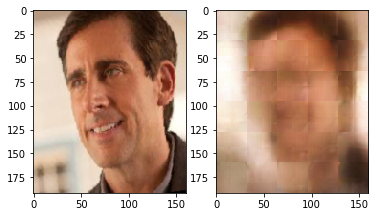

	Epoch 0 batch 3000 loss: 0.39420029520988464
	Epoch 0 batch 4000 loss: 0.3905855715274811


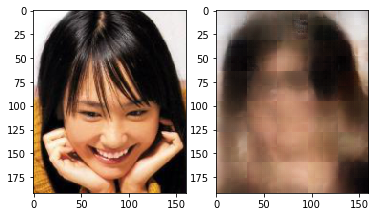

	Epoch 0 batch 5000 loss: 0.3358607888221741
	Epoch 0 batch 6000 loss: 0.3389859199523926


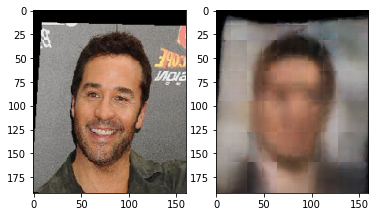

	Epoch 0 batch 7000 loss: 0.3029262125492096
	Epoch 0 batch 8000 loss: 0.3705839216709137


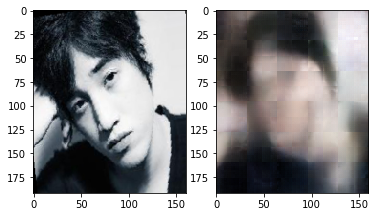

	Epoch 0 batch 9000 loss: 0.33906081318855286
	Epoch 0 batch 10000 loss: 0.35348647832870483


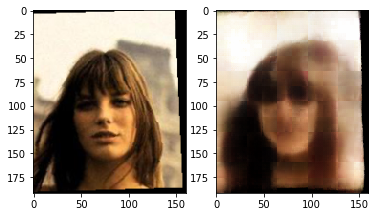

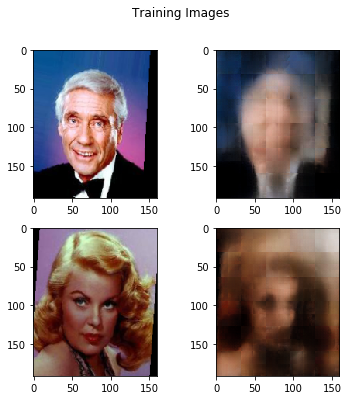

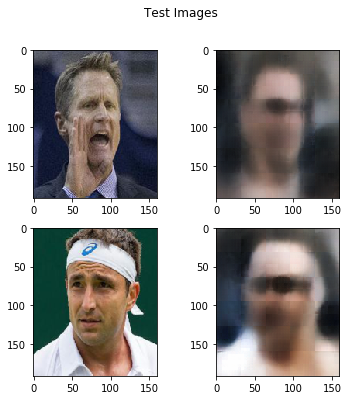

Epoch: 0 Train Loss: 4001.154082208872 Test Loss: 271.607912838459
	Epoch 1 batch 1000 loss: 0.30327343940734863
	Epoch 1 batch 2000 loss: 0.3679022789001465


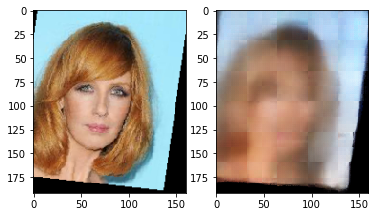

	Epoch 1 batch 3000 loss: 0.3313293159008026
	Epoch 1 batch 4000 loss: 0.32943952083587646


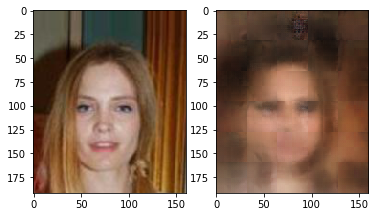

	Epoch 1 batch 5000 loss: 0.33195960521698
	Epoch 1 batch 6000 loss: 0.3448083996772766


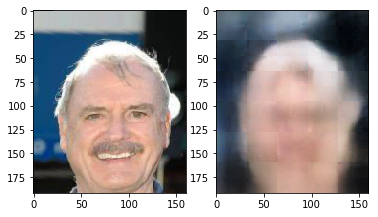

	Epoch 1 batch 7000 loss: 0.31656962633132935
	Epoch 1 batch 8000 loss: 0.3204936683177948


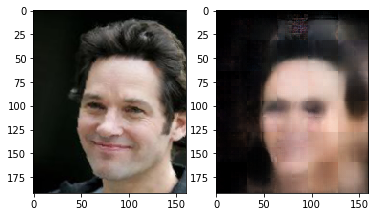

	Epoch 1 batch 9000 loss: 0.29382261633872986
	Epoch 1 batch 10000 loss: 0.302880197763443


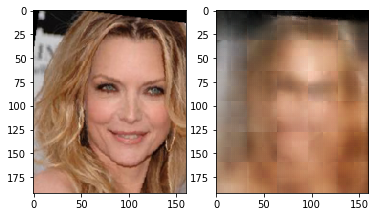

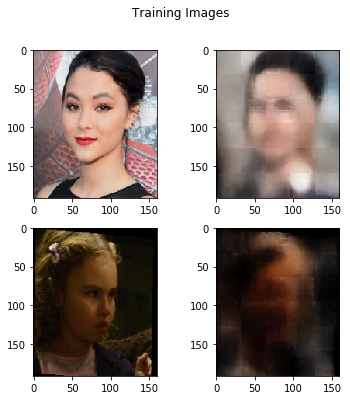

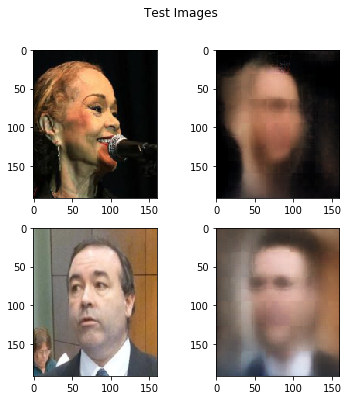

Epoch: 1 Train Loss: 3415.4812943935394 Test Loss: 242.78174895048141
	Epoch 2 batch 1000 loss: 0.27660635113716125
Interrupting... Saving model...


Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, b

Copying file://gen_model_6_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/342.5 MiB.                                    


In [10]:
# re-train encoder and decoder FC layers for 3 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=2000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_6_var.pt")

	Epoch 0 batch 1000 loss: 0.28675228357315063
	Epoch 0 batch 2000 loss: 0.27811554074287415
	Epoch 0 batch 3000 loss: 0.2720048427581787


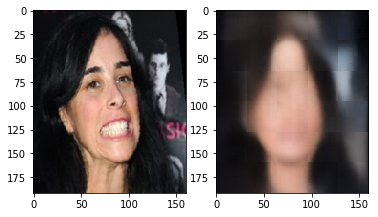

	Epoch 0 batch 4000 loss: 0.2997483015060425
	Epoch 0 batch 5000 loss: 0.2666492462158203
	Epoch 0 batch 6000 loss: 0.2723630368709564


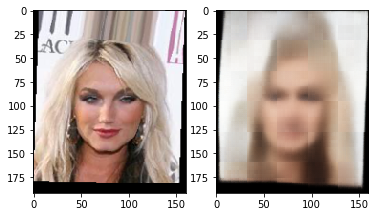

	Epoch 0 batch 7000 loss: 0.2685393691062927
	Epoch 0 batch 8000 loss: 0.26393967866897583
	Epoch 0 batch 9000 loss: 0.27955204248428345


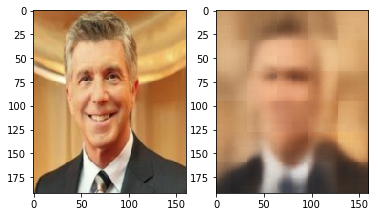

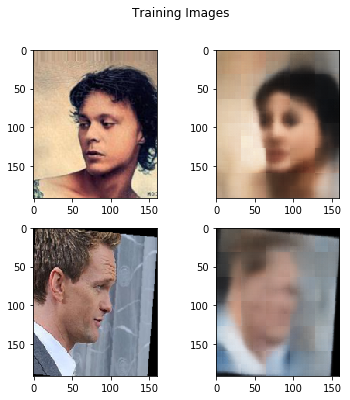

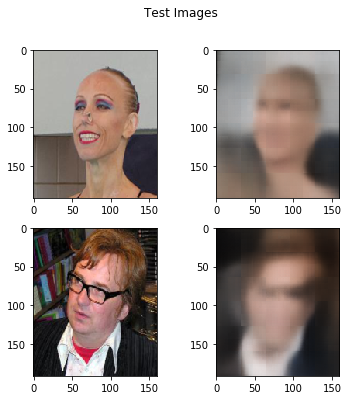

Epoch: 0 Train Loss: 2504.638672232628 Test Loss: 164.35827167332172
	Epoch 1 batch 1000 loss: 0.2920681834220886
	Epoch 1 batch 2000 loss: 0.2776850461959839
	Epoch 1 batch 3000 loss: 0.28459805250167847


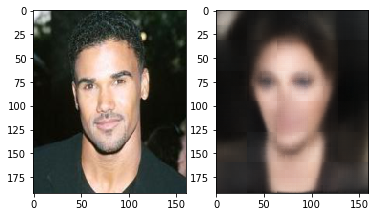

	Epoch 1 batch 4000 loss: 0.2667406499385834
	Epoch 1 batch 5000 loss: 0.25295543670654297
	Epoch 1 batch 6000 loss: 0.2718970775604248


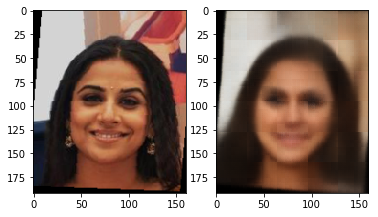

	Epoch 1 batch 7000 loss: 0.27197641134262085
	Epoch 1 batch 8000 loss: 0.2556580901145935
	Epoch 1 batch 9000 loss: 0.2599908709526062


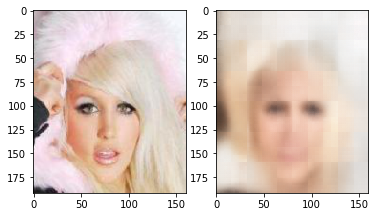

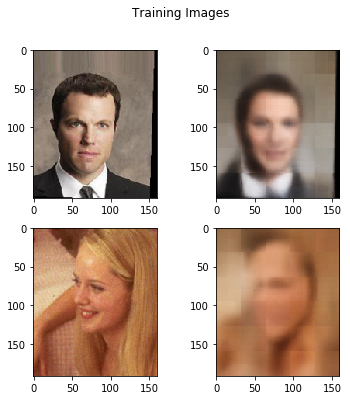

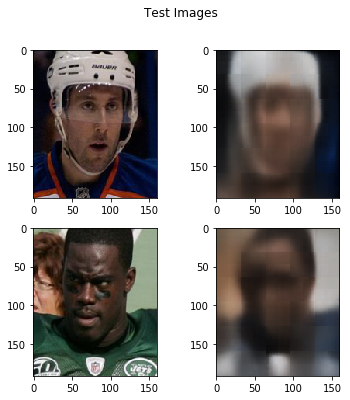

Epoch: 1 Train Loss: 2430.7477925270796 Test Loss: 164.2360088378191
Copying file://gen_model_6_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/342.5 MiB.                                    


In [13]:
# add a few more layers for 3 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=3000, num_epochs=2, display_images=1, scheduler=g_scheduler, save_path = "gen_model_6_var.pt")

	Epoch 2 batch 1000 loss: 0.2387205958366394
	Epoch 2 batch 2000 loss: 0.2431546151638031
	Epoch 2 batch 3000 loss: 0.21487858891487122


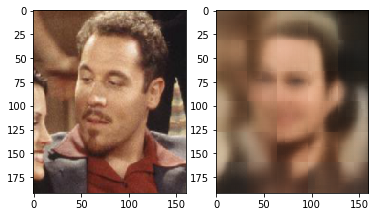

	Epoch 2 batch 4000 loss: 0.21164077520370483
	Epoch 2 batch 5000 loss: 0.20376992225646973
	Epoch 2 batch 6000 loss: 0.23296381533145905


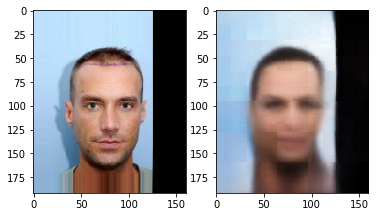

	Epoch 2 batch 7000 loss: 0.21578851342201233
	Epoch 2 batch 8000 loss: 0.2264283299446106
	Epoch 2 batch 9000 loss: 0.22158893942832947


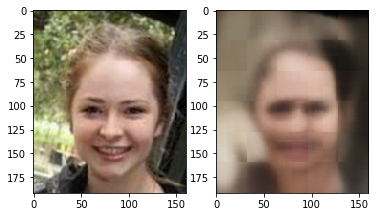

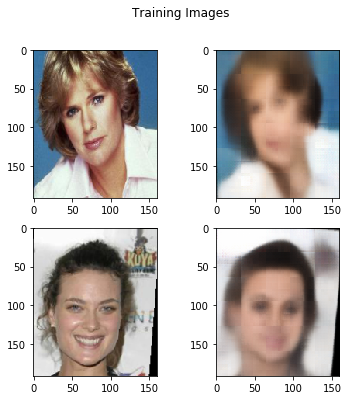

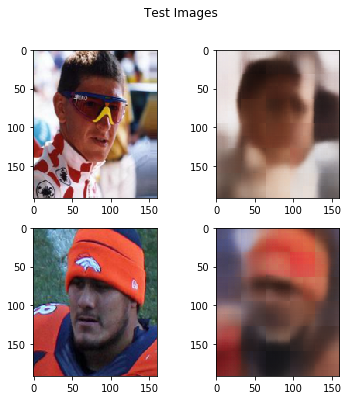

Epoch: 2 Train Loss: 2066.3087463378906 Test Loss: 125.50993767380714
	Epoch 3 batch 1000 loss: 0.22577764093875885
	Epoch 3 batch 2000 loss: 0.21548134088516235
	Epoch 3 batch 3000 loss: 0.21355140209197998


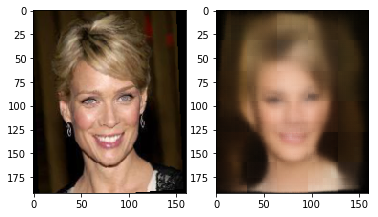

	Epoch 3 batch 4000 loss: 0.20337450504302979
	Epoch 3 batch 5000 loss: 0.2105943113565445
	Epoch 3 batch 6000 loss: 0.20437827706336975


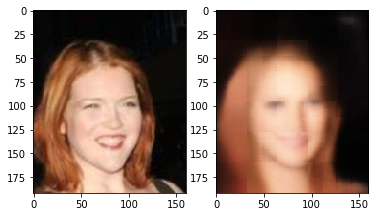

	Epoch 3 batch 7000 loss: 0.2075076550245285
	Epoch 3 batch 8000 loss: 0.21662336587905884
	Epoch 3 batch 9000 loss: 0.20207810401916504


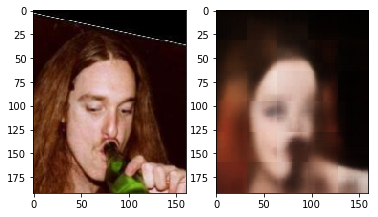

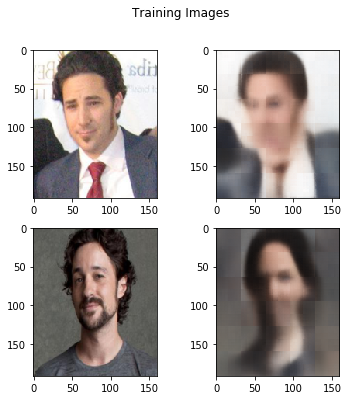

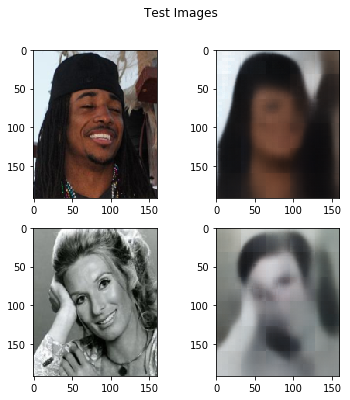

Epoch: 3 Train Loss: 1979.9855442494154 Test Loss: 115.57903292775154
	Epoch 4 batch 1000 loss: 0.21743421256542206
	Epoch 4 batch 2000 loss: 0.20623409748077393
	Epoch 4 batch 3000 loss: 0.2329629510641098


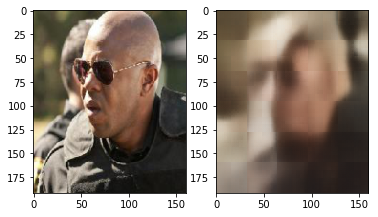

	Epoch 4 batch 4000 loss: 0.21866053342819214
	Epoch 4 batch 5000 loss: 0.21781976521015167
	Epoch 4 batch 6000 loss: 0.19337992370128632


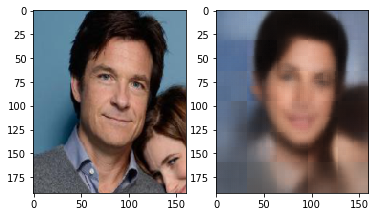

	Epoch 4 batch 7000 loss: 0.23176133632659912
	Epoch 4 batch 8000 loss: 0.20398452877998352
	Epoch 4 batch 9000 loss: 0.2096034288406372


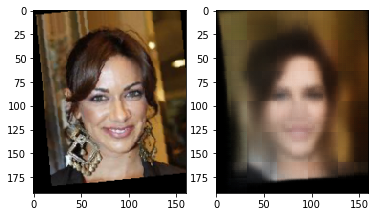

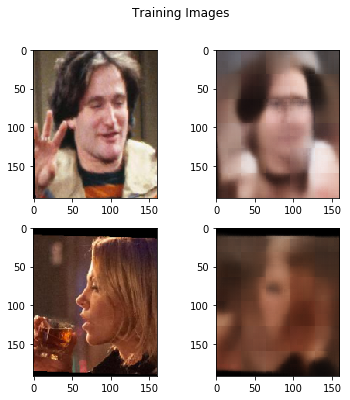

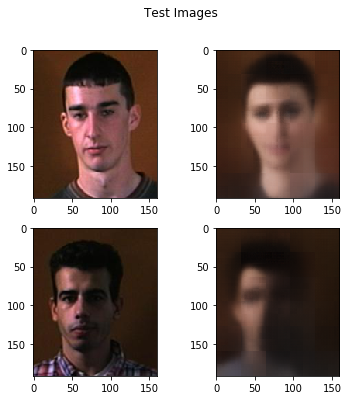

Epoch: 4 Train Loss: 1929.845176294446 Test Loss: 114.89461655914783
Copying file://gen_model_6_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/342.5 MiB.                                    


In [17]:
# train the whole thing
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=3000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_6_var.pt")

	Epoch 1 batch 1000 loss: 0.2075055092573166
	Epoch 1 batch 2000 loss: 0.20462919771671295
	Epoch 1 batch 3000 loss: 0.19618374109268188


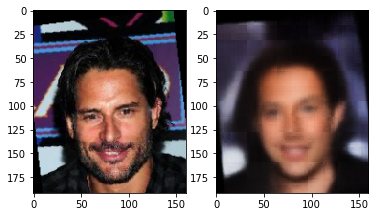

	Epoch 1 batch 4000 loss: 0.2173624187707901
	Epoch 1 batch 5000 loss: 0.2057666927576065


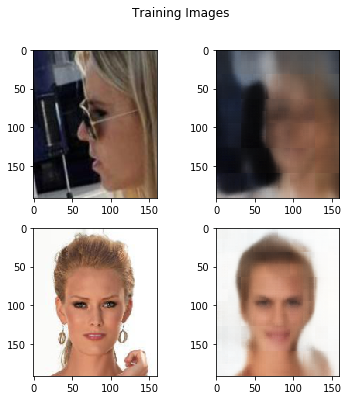

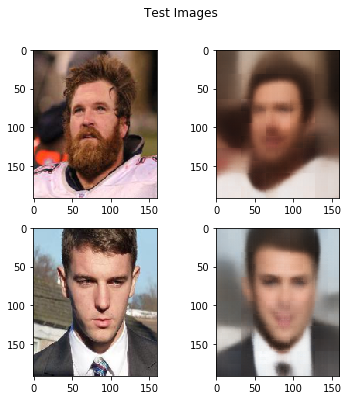

Epoch: 1 Train Loss: 1013.3120664209127 Test Loss: 108.0039780586958
	Epoch 2 batch 1000 loss: 0.2067776322364807
	Epoch 2 batch 2000 loss: 0.20567482709884644
	Epoch 2 batch 3000 loss: 0.1995200514793396


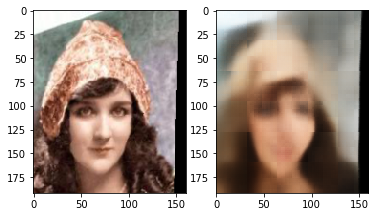

	Epoch 2 batch 4000 loss: 0.21368777751922607
	Epoch 2 batch 5000 loss: 0.19163569808006287


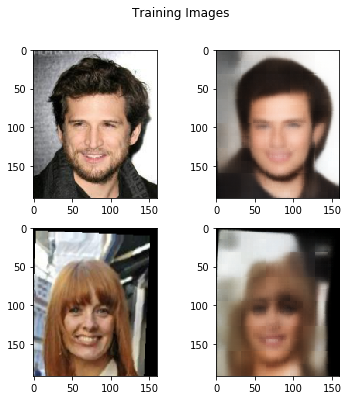

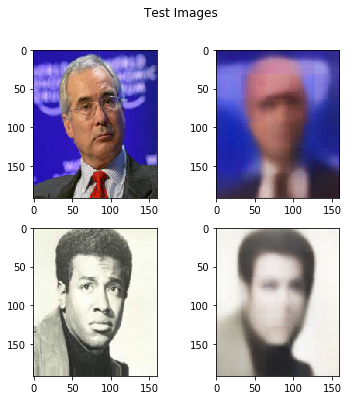

Epoch: 2 Train Loss: 999.5220083296299 Test Loss: 109.12924753129482
	Epoch 3 batch 1000 loss: 0.2001865655183792
	Epoch 3 batch 2000 loss: 0.20282195508480072
	Epoch 3 batch 3000 loss: 0.19623832404613495


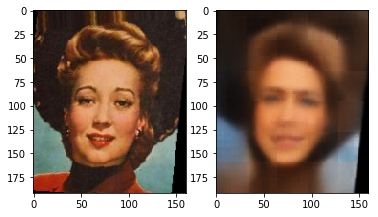

	Epoch 3 batch 4000 loss: 0.1785728633403778
	Epoch 3 batch 5000 loss: 0.20502644777297974


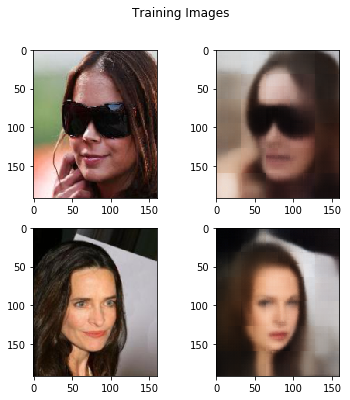

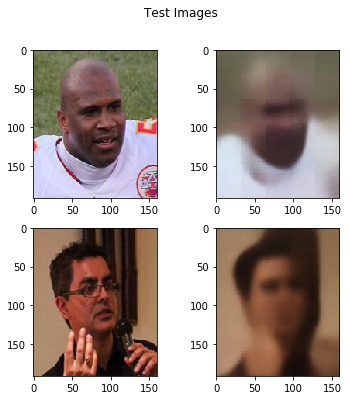

Epoch: 3 Train Loss: 990.7351709455252 Test Loss: 108.34603177011013
Copying file://gen_model_6_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/342.5 MiB.                                    


In [19]:
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=3000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_6_var.pt")

	Epoch 4 batch 1000 loss: 0.18960411846637726
	Epoch 4 batch 2000 loss: 0.1950787901878357
	Epoch 4 batch 3000 loss: 0.18872323632240295
	Epoch 4 batch 4000 loss: 0.18635079264640808


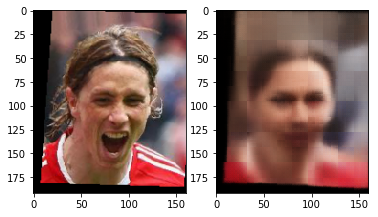

	Epoch 4 batch 5000 loss: 0.20321211218833923


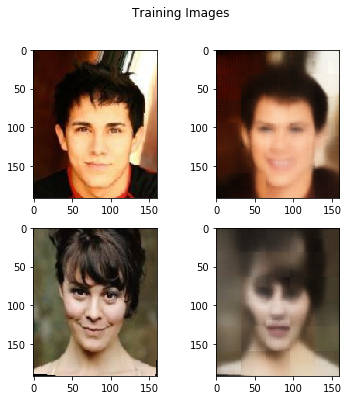

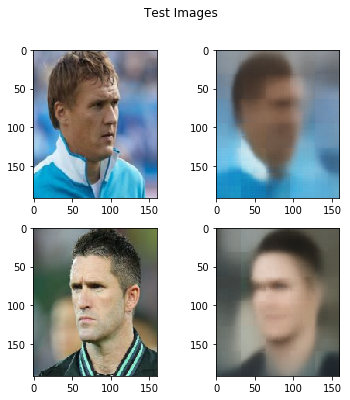

Epoch: 4 Train Loss: 981.3061962276697 Test Loss: 107.93655434250832
	Epoch 5 batch 1000 loss: 0.18636536598205566
	Epoch 5 batch 2000 loss: 0.1856733113527298
	Epoch 5 batch 3000 loss: 0.19705906510353088
	Epoch 5 batch 4000 loss: 0.20266926288604736


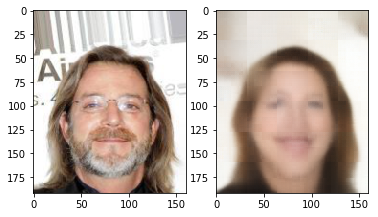

	Epoch 5 batch 5000 loss: 0.18849018216133118


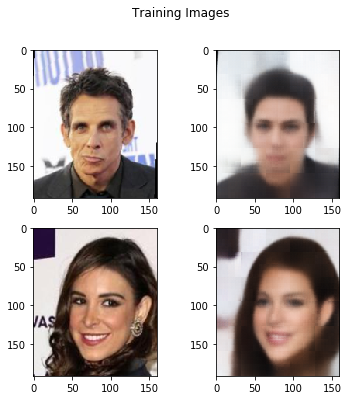

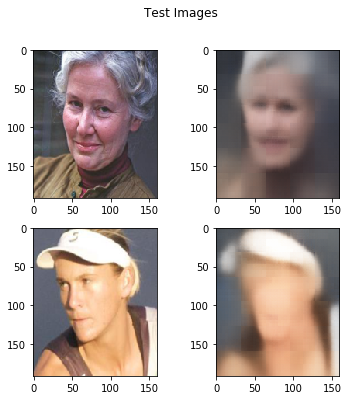

Epoch: 5 Train Loss: 973.6496315002441 Test Loss: 108.66555054485798
	Epoch 6 batch 1000 loss: 0.18026506900787354
	Epoch 6 batch 2000 loss: 0.20422258973121643
	Epoch 6 batch 3000 loss: 0.19860753417015076
	Epoch 6 batch 4000 loss: 0.1975211203098297


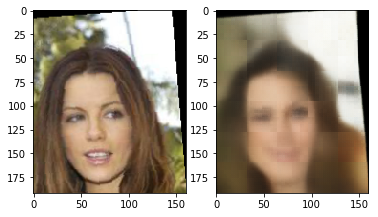

	Epoch 6 batch 5000 loss: 0.182454451918602


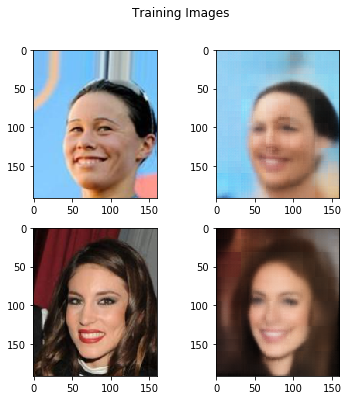

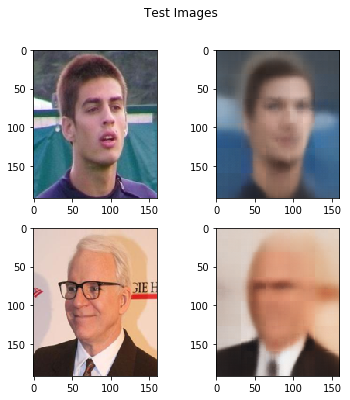

Epoch: 6 Train Loss: 966.4261549413204 Test Loss: 108.73341482877731
Copying file://gen_model_6_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/342.5 MiB.                                    


In [22]:
# re-train encoder and decoder FC layers for 1 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=4000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_6_var.pt")

	Epoch 7 batch 1000 loss: 0.19837862253189087
	Epoch 7 batch 2000 loss: 0.2163745015859604
	Epoch 7 batch 3000 loss: 0.20108051598072052
	Epoch 7 batch 4000 loss: 0.178484246134758


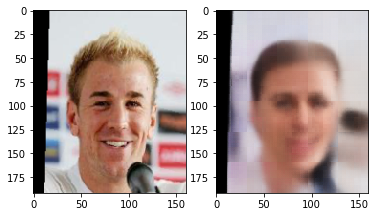

	Epoch 7 batch 5000 loss: 0.19319817423820496


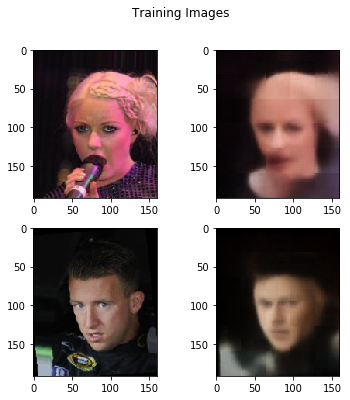

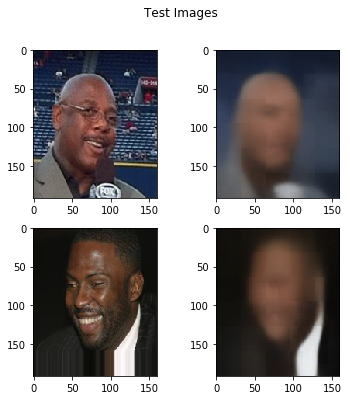

Epoch: 7 Train Loss: 965.2158172130585 Test Loss: 110.48864625394344
	Epoch 8 batch 1000 loss: 0.18927590548992157
	Epoch 8 batch 2000 loss: 0.18622270226478577
	Epoch 8 batch 3000 loss: 0.20005467534065247
	Epoch 8 batch 4000 loss: 0.18934530019760132


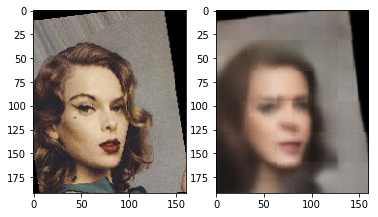

	Epoch 8 batch 5000 loss: 0.20176373422145844


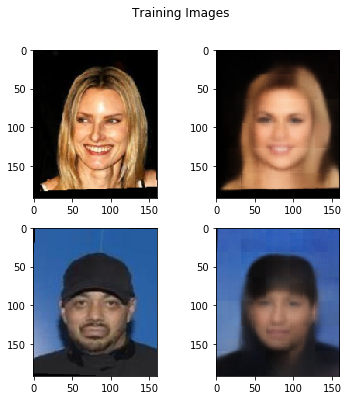

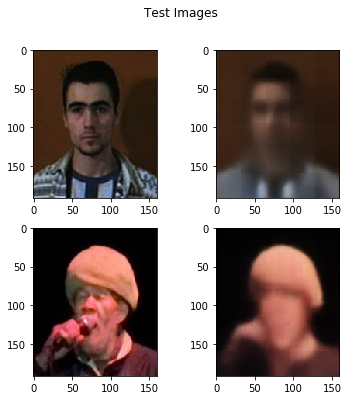

Epoch: 8 Train Loss: 959.8827717751265 Test Loss: 108.22075228393078
	Epoch 9 batch 1000 loss: 0.2021251618862152
	Epoch 9 batch 2000 loss: 0.18945437669754028
	Epoch 9 batch 3000 loss: 0.1910386085510254
	Epoch 9 batch 4000 loss: 0.1866246461868286


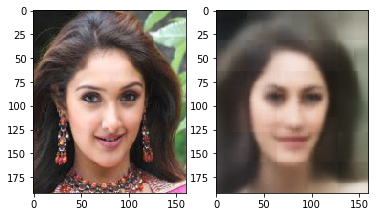

	Epoch 9 batch 5000 loss: 0.2090020328760147


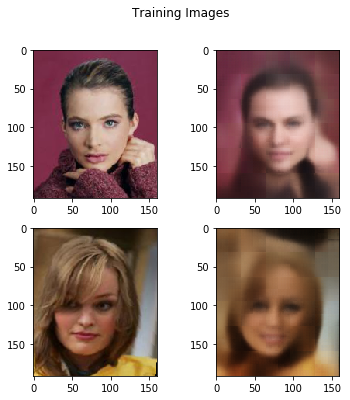

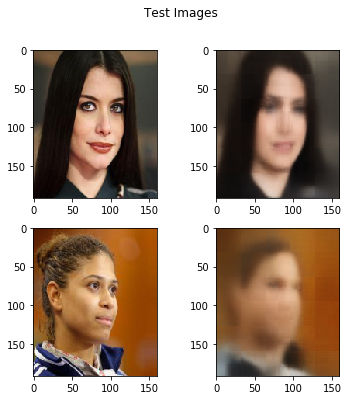

Epoch: 9 Train Loss: 954.400555357337 Test Loss: 107.11804749071598
Copying file://gen_model_6_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/342.5 MiB.                                    


In [24]:
# re-train encoder and decoder FC layers for 1 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=4000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_6_var.pt")

	Epoch 10 batch 1000 loss: 0.1772969663143158
	Epoch 10 batch 2000 loss: 0.1820702850818634
	Epoch 10 batch 3000 loss: 0.2005212903022766
	Epoch 10 batch 4000 loss: 0.17312116920948029


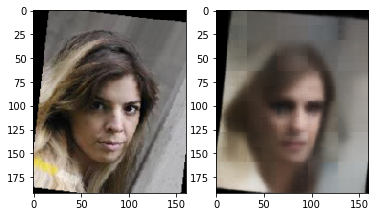

	Epoch 10 batch 5000 loss: 0.204579159617424


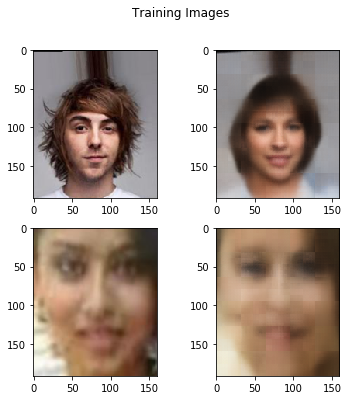

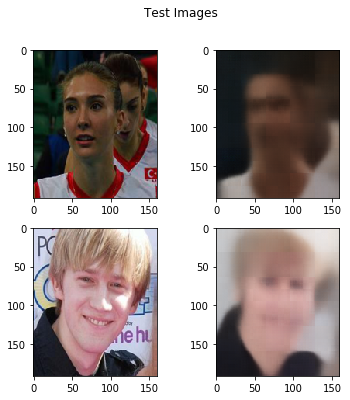

Epoch: 10 Train Loss: 942.4950060397387 Test Loss: 106.60968968272209
Copying file://gen_model_6_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/342.5 MiB.                                    


In [26]:
# re-train encoder and decoder FC layers for 1 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=4000, num_epochs=1, display_images=1, scheduler=g_scheduler, save_path = "gen_model_6_var.pt")

In [0]:
# since we are training from scratch there is no reason to not train the discriminator now
train_discriminator(discriminator, generator, train_loader, d_optimizer, g_optimizer, train_gen=True, train_disc=True, test_loader=test_loader, print_metrics=1000, extra_gen_train=16, plot_images=2000, num_epochs=1, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_5_var.pt", g_save_path="gen_model_5_var_gan.pt")

In [0]:
## CHECK MEAN AND VARIANCE OF CODES
with torch.no_grad():
    for (inputs, _) in test_loader:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, logvar = generator.encoder(inputs.cuda())
      recon = generator.decoder(codes)
      vae_loss(inputs.cuda(), recon, codes, logvar=logvar)
      print("Mean:", torch.mean(codes))
      print("Std:", codes.std())
      break

### Interpolation

In [0]:
## TRY SOME INTERPOLATION
with torch.no_grad():
    for (inputs, _) in test_loader:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, _ = generator.encoder(inputs.cuda())
      recon = generator.decoder(codes)

      # plot the images against their reconstructions
      fig, ax = plt.subplots(2, 2, figsize=(6,6))
      fig.suptitle("Training Images")
      ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
      ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
      ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
      ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
      plt.show()
      
      # interpolate the codes
      int_code = (codes[0] + codes[1]) / 2

      # decode the interpolation
      int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

      # plot the reconstruction
      plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
      plt.show()
      break

In [0]:
# fine-tune entire generator for 3 epochs
train(generator, train_loader2, g_optimizer, test_loader=None, print_metrics=2000, plot_images=10000, num_epochs=25, display_images=1, scheduler=g_scheduler, save_path = "gen_model_5_var.pt")

In [0]:
!mkdir data/Train
!cp -r data/images/Training_Pictures data/Train/Images

In [0]:
transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.Resize((192,160)),
      torchvision.transforms.ToTensor(),
    ])

train_dataset2 = torchvision.datasets.ImageFolder(
        root="data/Train",
        transform=transform2
    )

train_loader2 = torch.utils.data.DataLoader(
    train_dataset2,
    batch_size=48,
    num_workers=2,
    shuffle=True
)

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        plt.imshow(image.cpu().permute(1, 2, 0))
        plt.title(str(i))
        plt.show()
      break

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        generator.encoder.eval()
        generator.decoder.eval()
        # encode the images and reconstruct them
        codes, _ = generator.encoder(inputs.cuda())
        recon = generator.decoder(codes)

        # plot the images against their reconstructions
        fig, ax = plt.subplots(2, 2, figsize=(6,6))
        ax[0,0].imshow(inputs[23].cpu().permute(1, 2, 0) )
        ax[0,1].imshow(recon[23].cpu().detach().permute(1, 2, 0) )
        ax[1,0].imshow(inputs[5].cpu().permute(1, 2, 0) )
        ax[1,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
        plt.show()

        # interpolate the codes
        int_code = (codes[23] + codes[5]) / 2

          # decode the interpolation
        int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

        # plot the reconstruction
        plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
        plt.show()
        break
      break

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, _ = generator.encoder(inputs.cuda())
      recon = generator.decoder(codes)

      # plot the images against their reconstructions
      fig, ax = plt.subplots(2, 2, figsize=(6,6))
      ax[0,0].imshow(inputs[4].cpu().permute(1, 2, 0) )
      ax[0,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
      ax[1,0].imshow(inputs[4].cpu().permute(1, 2, 0) )
      ax[1,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
      plt.show()

      # interpolate the codes
      int_code = (codes[4] + codes[5]) / 2

        # decode the interpolation
      int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

      # plot the reconstruction
      plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
      plt.show()
      break
     

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        generator.encoder.eval()
        generator.decoder.eval()
        # encode the images and reconstruct them
        codes, _ = generator.encoder(inputs.cuda())
        recon = generator.decoder(codes)

        # plot the images against their reconstructions
        fig, ax = plt.subplots(2, 2, figsize=(6,6))
        ax[0,0].imshow(inputs[18].cpu().permute(1, 2, 0) )
        ax[0,1].imshow(recon[18].cpu().detach().permute(1, 2, 0) )
        ax[1,0].imshow(inputs[19].cpu().permute(1, 2, 0) )
        ax[1,1].imshow(recon[19].cpu().detach().permute(1, 2, 0) )
        plt.show()

        # interpolate the codes
        int_code = (codes[18] + codes[19]) / 2

          # decode the interpolation
        int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

        # plot the reconstruction
        plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
        plt.show()
        break
      break

In [0]:
train(generator, train_loader=train_loader2, optimizer=optimizer, print_metrics=10, plot_images=1, num_epochs=25, display_images=1, scheduler=scheduler)

In [0]:
train(model, train_loader=train_loader2, optimizer=optimizer, print_metrics=10, plot_images=1, num_epochs=30, display_images=1, scheduler=scheduler)

In [0]:
noise = np.random.normal(loc=0.3, scale=7.5, size=4096).reshape((1,4096,1,1))
image = model.decoder(torch.from_numpy(noise).cuda().float())
plt.imshow(image[0].cpu().detach().permute(1,2,0))
plt.show()